In [5]:
import csv
from pathlib import Path

import numpy as np
import pyvista as pv
from IPython.display import Markdown, display
from PIL import Image

REPO_ROOT = Path.cwd().resolve()
if not (REPO_ROOT / "results").is_dir() and (REPO_ROOT.parent / "results").is_dir():
    REPO_ROOT = REPO_ROOT.parent

BASELINE_RESULTS_DIR = REPO_ROOT / "results/original_trellis_view18"
FINETUNED_RESULTS_DIR = REPO_ROOT / "results/objective1_view18_full"
RETRIEVAL_RESULTS_DIR = REPO_ROOT / "results/retrieval_unified_view18"

BASELINE_MESH_DIR = BASELINE_RESULTS_DIR / "predictions/original_trellis/seed_42/mesh"
FINETUNED_MESH_DIR = FINETUNED_RESULTS_DIR / "predictions/objective1/seed_42/mesh"
RETRIEVAL_MESH_DIR = RETRIEVAL_RESULTS_DIR / "predictions/retrieval_unified/mesh"
GROUND_TRUTH_MESH_DIR = RETRIEVAL_RESULTS_DIR / "references/ground_truth_mesh"

BASELINE_METRICS_FILE = BASELINE_RESULTS_DIR / "mesh_metrics/per_sample.csv"
RETRIEVAL_METRICS_FILE = RETRIEVAL_RESULTS_DIR / "per_sample.csv"
MANIFEST_FILE = RETRIEVAL_RESULTS_DIR / "visualization_manifest.csv"
FINAL_METHOD = "retrieval_unified"
METRIC_MARGIN = 2
CATEGORIES = ("bus", "car")
BEST_PER_CATEGORY = 10

# Remove the positive-x half to expose the interior.
CUT_NORMAL = np.array([1.0, 0.0, 0.0])
CUT_FRACTION = 0.50

PIPELINE1_METHODS = [
    ("Ground truth", GROUND_TRUTH_MESH_DIR, "#d9dde5"),
    ("Original TRELLIS · view 18", BASELINE_MESH_DIR, "#9ba8b8"),
    ("Fine-tuned TRELLIS · view 18", FINETUNED_MESH_DIR, "#f4a261"),
]
PIPELINE2_METHODS = [
    ("Ground truth", GROUND_TRUTH_MESH_DIR, "#d9dde5"),
    ("Fine-tuned TRELLIS · view 18", FINETUNED_MESH_DIR, "#f4a261"),
    ("Retrieval refinement", RETRIEVAL_MESH_DIR, "#55bde8"),
]

for required in (BASELINE_METRICS_FILE, RETRIEVAL_METRICS_FILE, MANIFEST_FILE):
    if not required.is_file():
        raise FileNotFoundError(f"Missing result file: {required}")

baseline_metrics = {}
with BASELINE_METRICS_FILE.open(newline="") as file:
    for row in csv.DictReader(file):
        if row["category"] in CATEGORIES and int(row["margin"]) == METRIC_MARGIN:
            gt_count = int(row["gt_internal_voxels"])
            pred_count = int(row["pred_internal_voxels"])
            baseline_metrics[row["sample_id"]] = {
                "category": row["category"],
                "precision": float(row["internal_precision"]),
                "recall": float(row["internal_recall"]),
                "f1": float(row["internal_f1"]),
                "ratio": pred_count / gt_count if gt_count else float(pred_count == 0),
            }

refinement_metrics = {}
with RETRIEVAL_METRICS_FILE.open(newline="") as file:
    for row in csv.DictReader(file):
        if row["category"] in CATEGORIES and int(row["margin"]) == METRIC_MARGIN:
            refinement_metrics.setdefault(row["sample_id"], {})[row["method"]] = {
                "category": row["category"],
                "precision": float(row["internal_precision"]),
                "recall": float(row["internal_recall"]),
                "f1": float(row["internal_f1"]),
                "ratio": float(row["pred_to_gt_internal_ratio"]),
                "selected_rank": int(row["selected_rank"]),
                "fallback": bool(int(row["used_objective1_fallback"])),
                "gate_reason": row["gate_reason"],
                "policy_mode": row.get("policy_mode", "unknown"),
            }

manifest_by_category = {category: [] for category in CATEGORIES}
with MANIFEST_FILE.open(newline="") as file:
    for row in csv.DictReader(file):
        if row["category"] in CATEGORIES:
            manifest_by_category[row["category"]].append(row)

# Keep the established headline examples: accepted retrievals first, ranked
# by semantic quality and precision, with fallbacks used only if necessary.
for category, candidates in manifest_by_category.items():
    candidates.sort(
        key=lambda row: (
            -int(row["used_objective1_fallback"]),
            float(row["semantic_quality_delta"]),
            float(row["retrieval_internal_precision"]),
        ),
        reverse=True,
    )
    if len(candidates) < BEST_PER_CATEGORY:
        raise ValueError(f"Manifest has only {len(candidates)} {category} samples")
    manifest_by_category[category] = candidates[:BEST_PER_CATEGORY]

best_ids_by_category = {
    category: [row["sample_id"] for row in manifest_by_category[category]]
    for category in CATEGORIES
}
sample_ids = [sample_id for category in CATEGORIES for sample_id in best_ids_by_category[category]]
if len(sample_ids) != len(set(sample_ids)):
    raise ValueError("Visualization manifest contains duplicate sample IDs")

for sample_id in sample_ids:
    if sample_id not in baseline_metrics:
        raise ValueError(f"Missing original-TRELLIS metrics for {sample_id}")
    if set(refinement_metrics.get(sample_id, {})) != {"objective1", FINAL_METHOD}:
        raise ValueError(f"Incomplete fine-tuning/retrieval metrics for {sample_id}")
    for _, directory, _ in PIPELINE1_METHODS + PIPELINE2_METHODS:
        mesh_path = directory / f"{sample_id}.ply"
        if not mesh_path.is_file():
            raise FileNotFoundError(f"Missing smooth mesh: {mesh_path}")

def pipeline1_f1_delta(sample_id):
    return refinement_metrics[sample_id]["objective1"]["f1"] - baseline_metrics[sample_id]["f1"]

def pipeline2_f1_delta(sample_id):
    return refinement_metrics[sample_id][FINAL_METHOD]["f1"] - refinement_metrics[sample_id]["objective1"]["f1"]

print(f"Verified {len(sample_ids)} objects: 10 buses and 10 cars")
for category in CATEGORIES:
    ids = best_ids_by_category[category]
    mean_stage1 = np.mean([pipeline1_f1_delta(sample_id) for sample_id in ids])
    mean_stage2 = np.mean([pipeline2_f1_delta(sample_id) for sample_id in ids])
    print(f"{category}: mean ΔF1 fine-tuning={mean_stage1:+.3f}, retrieval={mean_stage2:+.3f}")

Verified 20 objects: 10 buses and 10 cars
bus: mean ΔF1 fine-tuning=+0.280, retrieval=+0.148
car: mean ΔF1 fine-tuning=+0.274, retrieval=+0.191


In [6]:
def read_triangle_surface(path):
    mesh = pv.read(path)
    if isinstance(mesh, pv.MultiBlock):
        mesh = mesh.combine()
    surface = mesh.extract_surface().triangulate().clean()
    if surface.n_cells == 0:
        raise ValueError(f"Empty triangle surface: {path}")
    return surface


def camera_for_cut(normal, center, object_size):
    up = np.array([0.0, 0.0, 1.0])
    if abs(normal @ up) > 0.9:
        up = np.array([1.0, 0.0, 0.0])
    side = np.cross(up, normal)
    position = center + object_size * (2.1 * normal + 0.45 * side + 0.30 * up)
    return [position.tolist(), center.tolist(), up.tolist()]


def render_smooth_comparison(sample_id, methods):
    surfaces = {
        label: read_triangle_surface(directory / f"{sample_id}.ply")
        for label, directory, _ in methods
    }
    ground_truth = surfaces["Ground truth"]
    normal = CUT_NORMAL / np.linalg.norm(CUT_NORMAL)
    projection = np.asarray(ground_truth.points) @ normal
    cut_offset = projection.max() - CUT_FRACTION * np.ptp(projection)
    cut_origin = np.asarray(ground_truth.center) + normal * (
        cut_offset - np.asarray(ground_truth.center) @ normal
    )
    center = np.asarray(ground_truth.center)
    object_size = ground_truth.length

    plotter = pv.Plotter(shape=(1, 3), off_screen=True, window_size=(1800, 620), border=False)
    try:
        plotter.enable_anti_aliasing("ssaa")
    except Exception:
        pass
    for column, (label, _, color) in enumerate(methods):
        cut = surfaces[label].clip(normal=normal, origin=cut_origin, invert=True)
        plotter.subplot(0, column)
        plotter.set_background("white")
        plotter.add_mesh(
            cut, color=color, smooth_shading=True, ambient=0.30,
            diffuse=0.72, specular=0.18, show_edges=False,
        )
        plotter.add_text(label, position="upper_left", color="black", font_size=11)
    plotter.link_views()
    plotter.camera_position = camera_for_cut(normal, center, object_size)
    plotter.camera.parallel_projection = True
    plotter.camera.parallel_scale = 0.56 * object_size
    image = plotter.screenshot(return_img=True)
    plotter.close()
    return Image.fromarray(image)

## **Ground Truth vs. Original TRELLIS vs. Fine-Tuned TRELLIS**

### Bus — 10 examples

01. Internal F1 0.001 → 0.334 (+0.332) · bus__f1620392bd8d9249193d7855ecfc1bd3


/var/folders/fx/7wx0ny_14f5gh3xtfrbdmdym0000gn/T/ipykernel_16660/1025251416.py:5: PyVistaFutureWarning: The default value of `algorithm` for the filter
`PolyData.extract_surface` will change in the future. It currently defaults to
`'dataset_surface'`, but will change to `None`. Explicitly set the `algorithm` keyword to
silence this warning.
  surface = mesh.extract_surface().triangulate().clean()


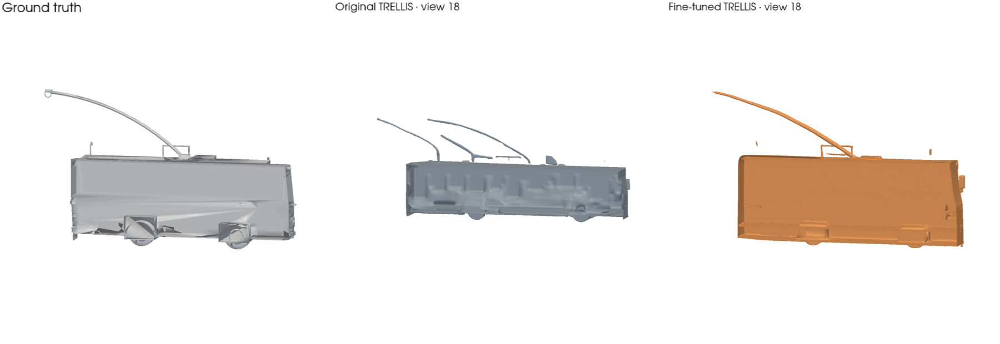

02. Internal F1 0.064 → 0.198 (+0.135) · bus__f5636ed22f1a3daa193d7855ecfc1bd3


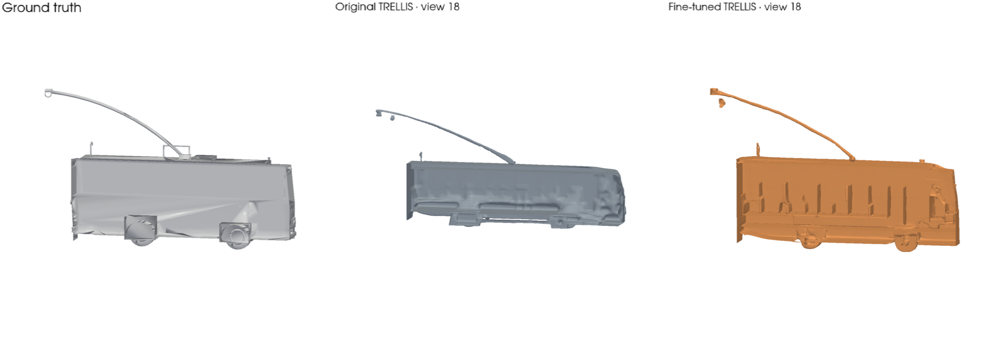

03. Internal F1 0.000 → 0.105 (+0.105) · bus__e311aaea6c2662e7193d7855ecfc1bd3


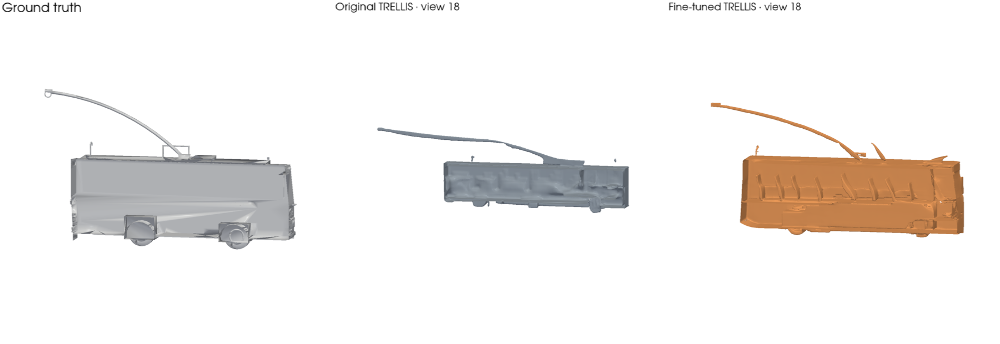

04. Internal F1 0.048 → 0.547 (+0.499) · bus__e9afd0d7aa653df4b129901f80d24b7b


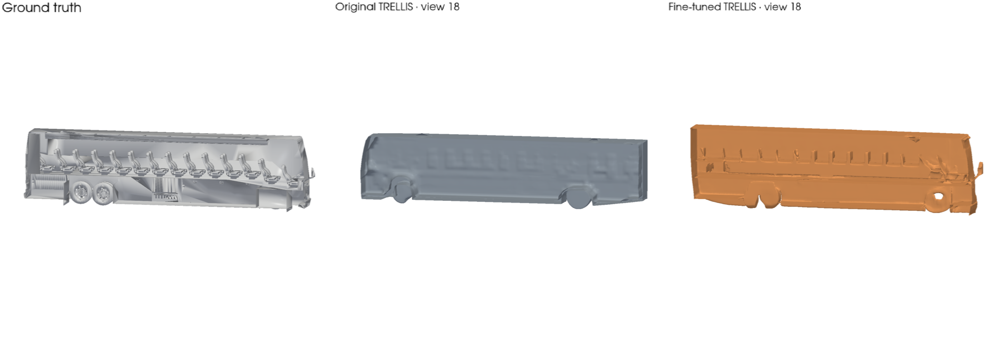

05. Internal F1 0.077 → 0.305 (+0.228) · bus__f0fb07c3592f55b2c2ae5d9462fe97f3


/var/folders/fx/7wx0ny_14f5gh3xtfrbdmdym0000gn/T/ipykernel_16660/1025251416.py:41: InvalidMeshWarning: PolyData mesh is not valid:
 - Mesh has 1 cell array with incorrect length (length must be 87058). Invalid array: 'vtkOriginalCellIds' (87050)
  cut = surfaces[label].clip(normal=normal, origin=cut_origin, invert=True)
/Users/peter/Desktop/Semester 2/ML3D/ML3D/lib/python3.14/site-packages/vtkmodules/util/vtkAlgorithm.py:198: InvalidMeshWarning: PolyData mesh is not valid:
 - Mesh has 1 cell array with incorrect length (length must be 87058). Invalid array: 'vtkOriginalCellIds' (87050)
  return self.RequestData(request, inInfo, outInfo)
/var/folders/fx/7wx0ny_14f5gh3xtfrbdmdym0000gn/T/ipykernel_16660/1025251416.py:44: InvalidMeshWarning: PolyData mesh is not valid:
 - Mesh has 1 cell array with incorrect length (length must be 87058). Invalid array: 'vtkOriginalCellIds' (87050)
  plotter.add_mesh(


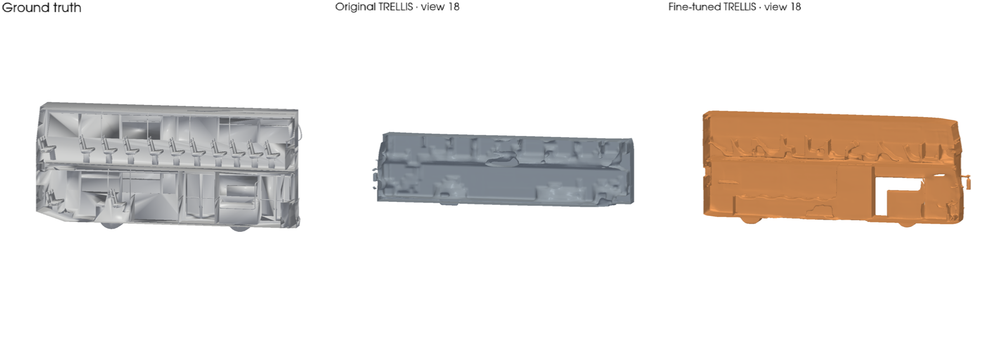

06. Internal F1 0.059 → 0.329 (+0.270) · bus__e92f10218f66fcd64931a7929d89a2d3


/var/folders/fx/7wx0ny_14f5gh3xtfrbdmdym0000gn/T/ipykernel_16660/1025251416.py:5: PyVistaFutureWarning: The default value of `algorithm` for the filter
`PolyData.extract_surface` will change in the future. It currently defaults to
`'dataset_surface'`, but will change to `None`. Explicitly set the `algorithm` keyword to
silence this warning.
  surface = mesh.extract_surface().triangulate().clean()


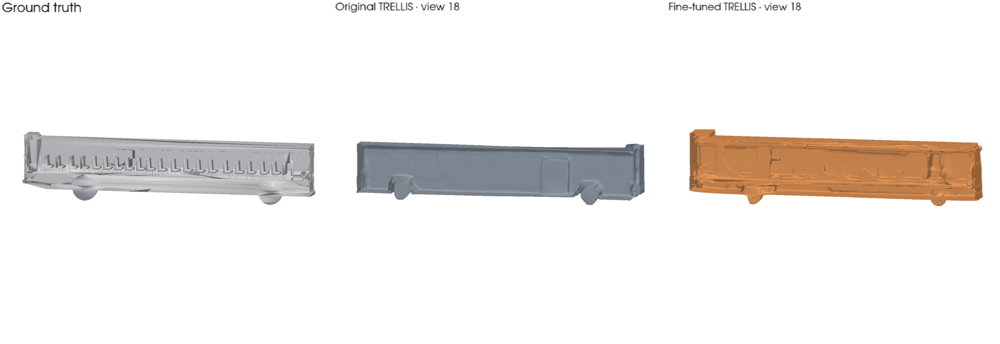

07. Internal F1 0.166 → 0.463 (+0.297) · bus__f7c66493e877829eff8a739dd4de4368


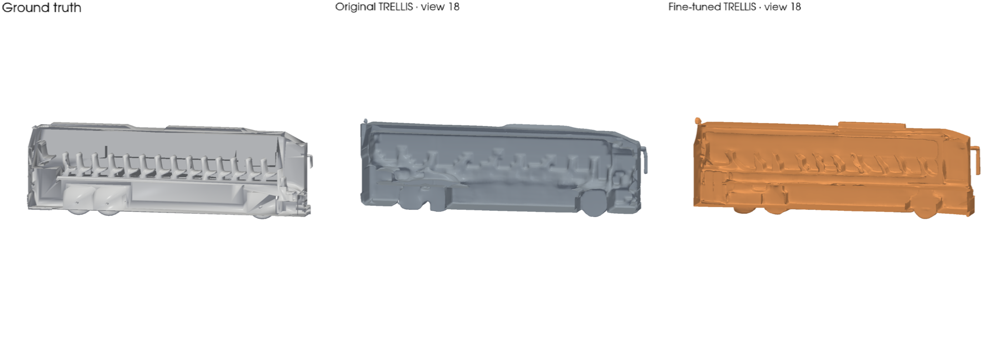

08. Internal F1 0.104 → 0.484 (+0.381) · bus__f61fe8b152f5888a54f791e4a421252


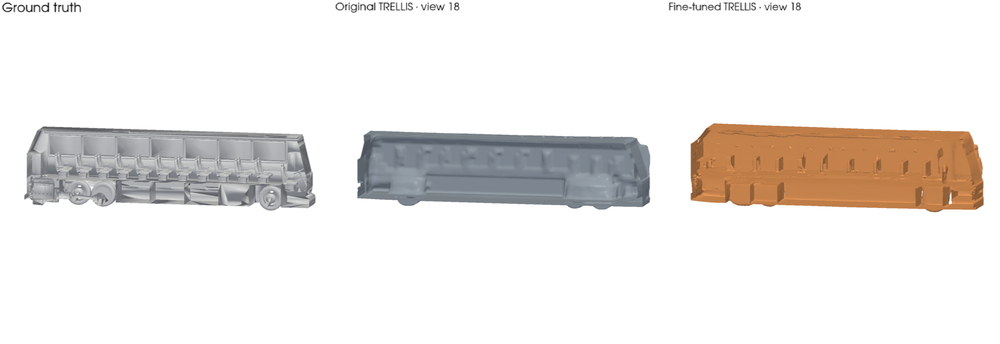

09. Internal F1 0.074 → 0.358 (+0.285) · bus__f735f0310f9240227037eba625e09a52


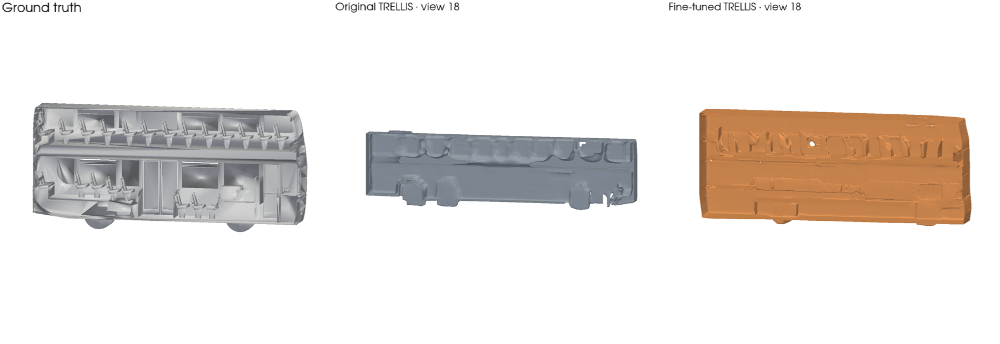

10. Internal F1 0.090 → 0.362 (+0.271) · bus__f90bafa70be9bf1bd4713685ae50fa13


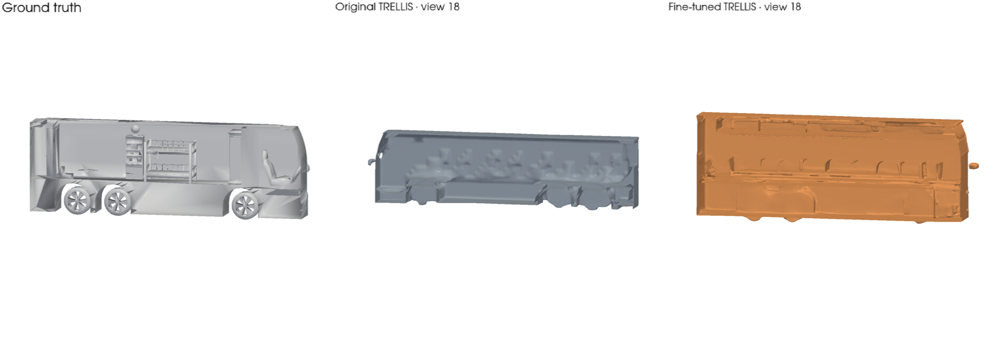

### Car — 10 examples

01. Internal F1 0.045 → 0.426 (+0.381) · car__fabcb04fc015f822ca8bf2993ca245b


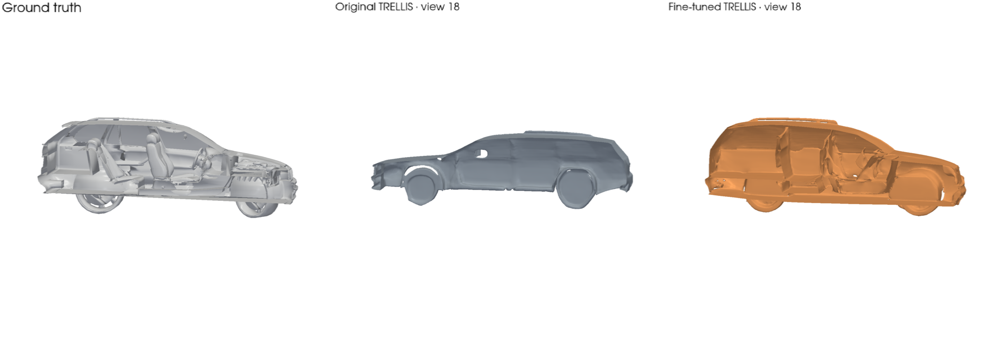

02. Internal F1 0.192 → 0.412 (+0.220) · car__f1b928427f5a3a7fc6d5ebddbbbc39f


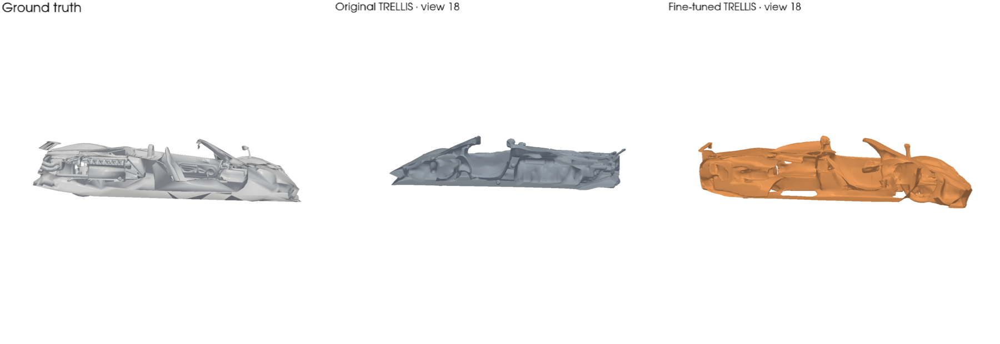

03. Internal F1 0.098 → 0.330 (+0.232) · car__f1a20b5b20366d5378df335b5e4f64d1


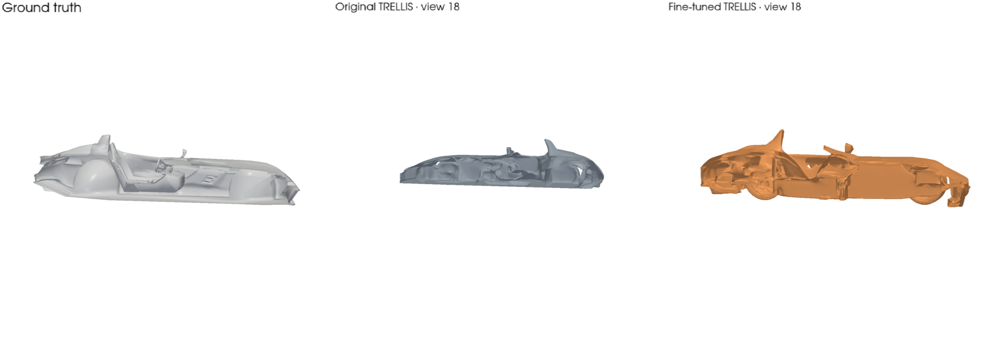

04. Internal F1 0.251 → 0.467 (+0.216) · car__e8a8d47957d15bbf8079d5a13e411210


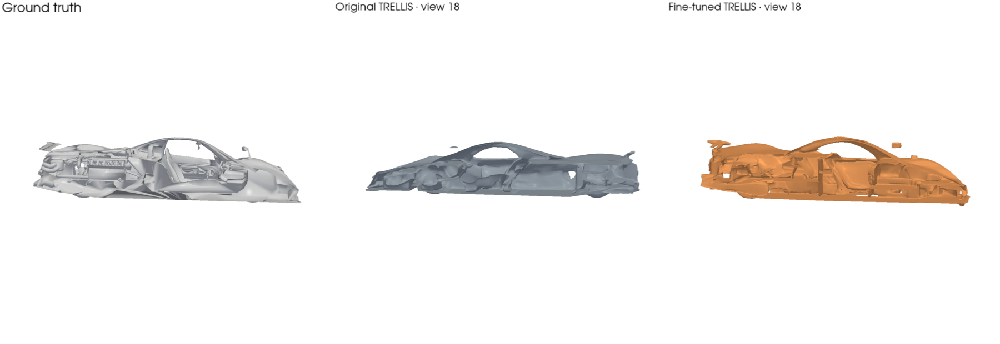

05. Internal F1 0.183 → 0.315 (+0.133) · car__eec2ea5ac4e048836a2345809e2bb169


/var/folders/fx/7wx0ny_14f5gh3xtfrbdmdym0000gn/T/ipykernel_16660/1025251416.py:41: InvalidMeshWarning: PolyData mesh is not valid:
 - Mesh has 1 cell array with incorrect length (length must be 152058). Invalid array: 'vtkOriginalCellIds' (152024)
  cut = surfaces[label].clip(normal=normal, origin=cut_origin, invert=True)
/Users/peter/Desktop/Semester 2/ML3D/ML3D/lib/python3.14/site-packages/vtkmodules/util/vtkAlgorithm.py:198: InvalidMeshWarning: PolyData mesh is not valid:
 - Mesh has 1 cell array with incorrect length (length must be 152058). Invalid array: 'vtkOriginalCellIds' (152024)
  return self.RequestData(request, inInfo, outInfo)
/var/folders/fx/7wx0ny_14f5gh3xtfrbdmdym0000gn/T/ipykernel_16660/1025251416.py:44: InvalidMeshWarning: PolyData mesh is not valid:
 - Mesh has 1 cell array with incorrect length (length must be 152058). Invalid array: 'vtkOriginalCellIds' (152024)
  plotter.add_mesh(


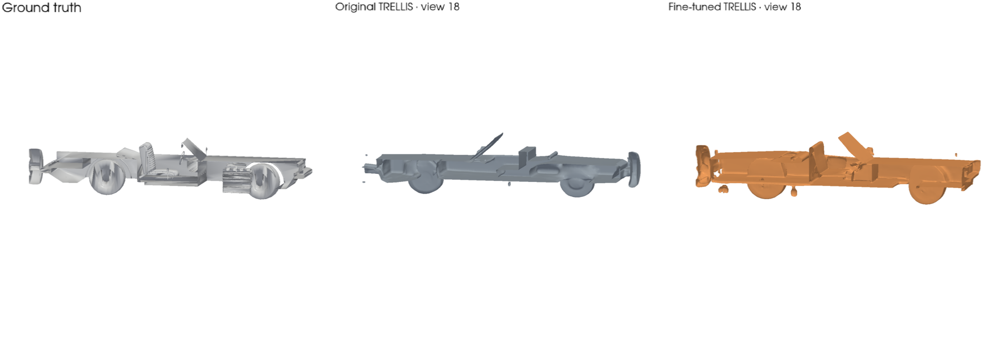

/var/folders/fx/7wx0ny_14f5gh3xtfrbdmdym0000gn/T/ipykernel_16660/1025251416.py:5: PyVistaFutureWarning: The default value of `algorithm` for the filter
`PolyData.extract_surface` will change in the future. It currently defaults to
`'dataset_surface'`, but will change to `None`. Explicitly set the `algorithm` keyword to
silence this warning.
  surface = mesh.extract_surface().triangulate().clean()


06. Internal F1 0.169 → 0.470 (+0.302) · car__f06af3b73004c92ec7193c87bbfa9088


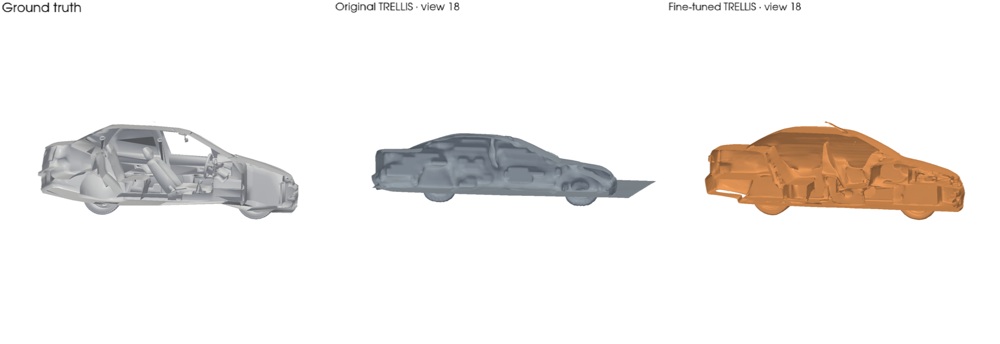

07. Internal F1 0.230 → 0.414 (+0.184) · car__e67e3e3a21393927df59757e1209f2c7


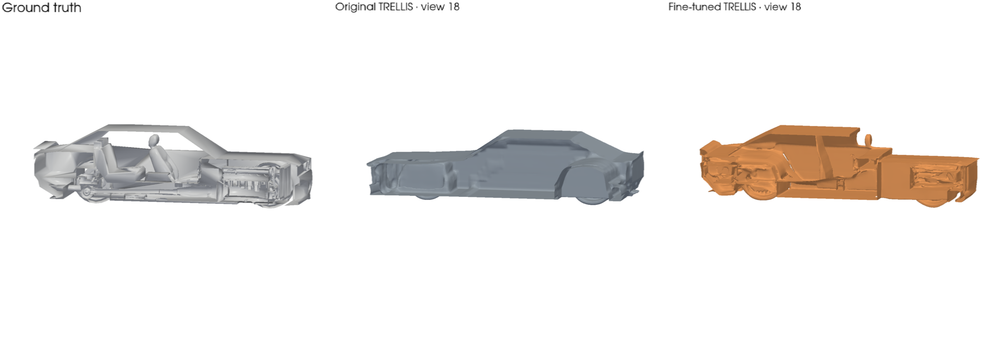

08. Internal F1 0.033 → 0.429 (+0.396) · car__eb59c9376d1e04ab49352dd33f95cb9e


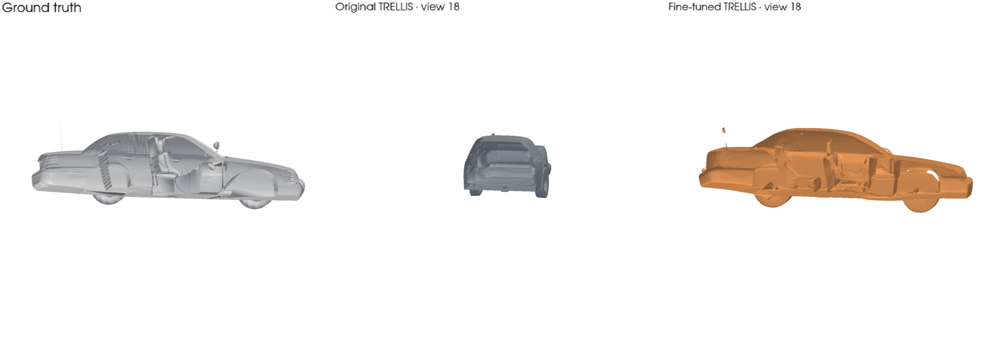

09. Internal F1 0.148 → 0.346 (+0.199) · car__f10e32c6daaf237f13ded1857c15b5b6


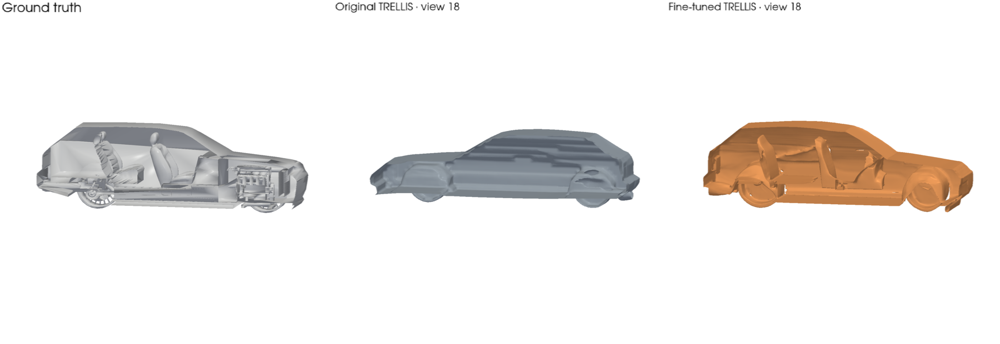

10. Internal F1 0.031 → 0.508 (+0.478) · car__f21188e5f1a6468050bb0437668bebb7


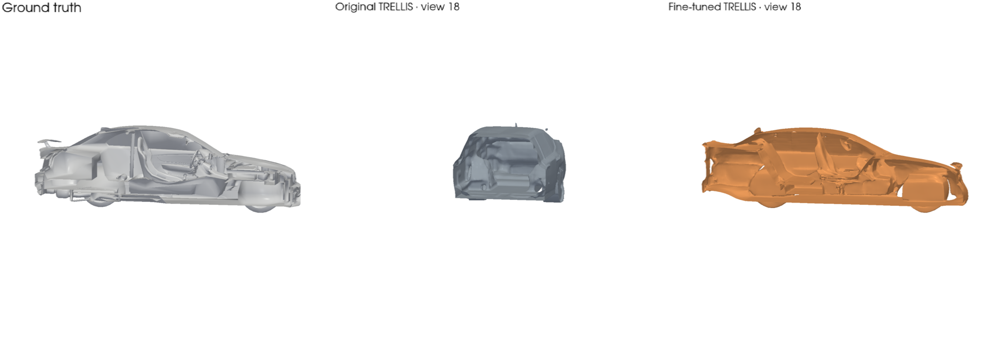

In [7]:
for category in CATEGORIES:
    display(Markdown(f"### {category.replace('_', ' ').title()} — {BEST_PER_CATEGORY} examples"))
    for index, sample_id in enumerate(best_ids_by_category[category], start=1):
        original = baseline_metrics[sample_id]
        fine_tuned = refinement_metrics[sample_id]["objective1"]
        print(
            f"{index:02d}. Internal F1 {original['f1']:.3f} → {fine_tuned['f1']:.3f} "
            f"({pipeline1_f1_delta(sample_id):+.3f}) · {sample_id}"
        )
        display(render_smooth_comparison(sample_id, PIPELINE1_METHODS))

## **Ground Truth vs. Fine-Tuned TRELLIS vs. Retrieval Refinement**

### Bus — 10 examples

01. Internal F1 0.334 → 0.954 (+0.620) · structural_replace · bus__f1620392bd8d9249193d7855ecfc1bd3


/var/folders/fx/7wx0ny_14f5gh3xtfrbdmdym0000gn/T/ipykernel_16660/1025251416.py:5: PyVistaFutureWarning: The default value of `algorithm` for the filter
`PolyData.extract_surface` will change in the future. It currently defaults to
`'dataset_surface'`, but will change to `None`. Explicitly set the `algorithm` keyword to
silence this warning.
  surface = mesh.extract_surface().triangulate().clean()


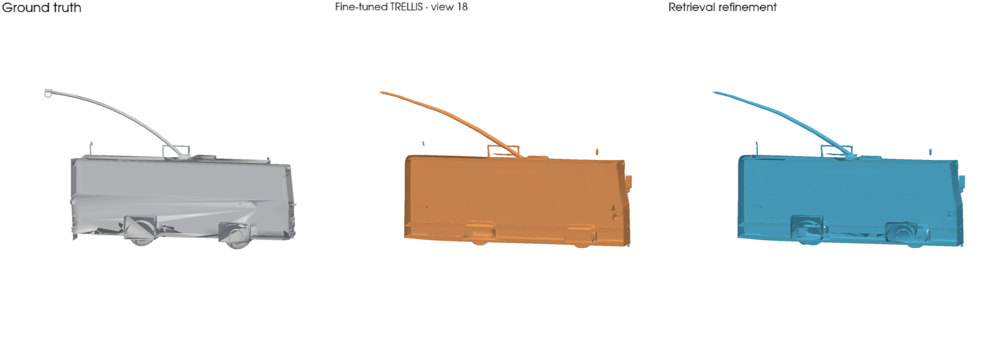

02. Internal F1 0.198 → 0.725 (+0.527) · structural_replace · bus__f5636ed22f1a3daa193d7855ecfc1bd3


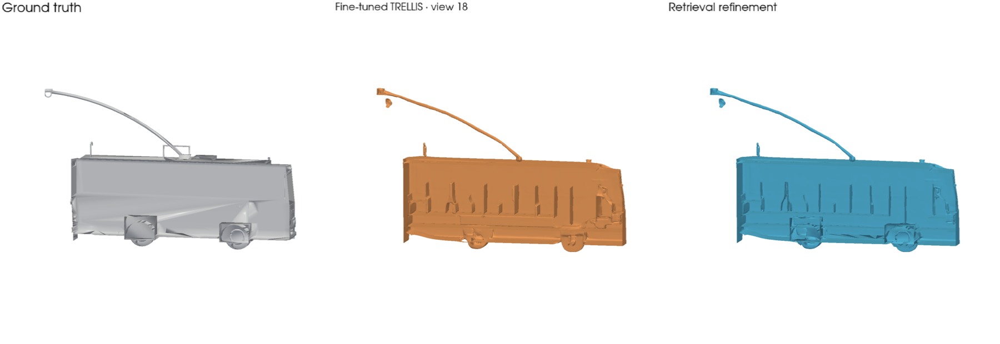

03. Internal F1 0.105 → 0.340 (+0.235) · structural_replace · bus__e311aaea6c2662e7193d7855ecfc1bd3


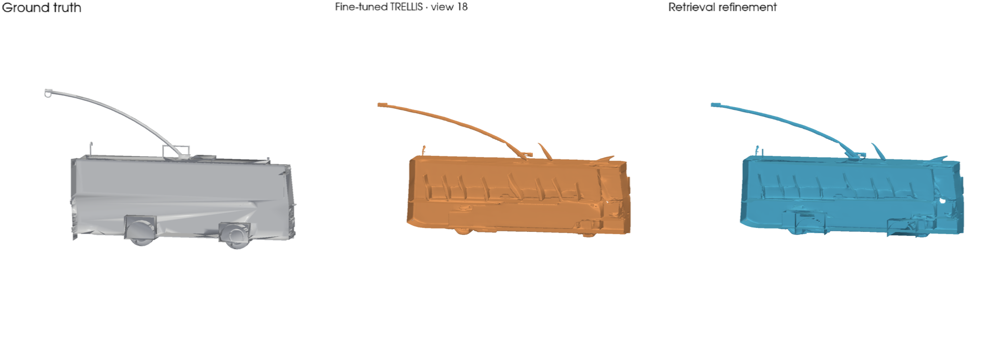

04. Internal F1 0.547 → 0.857 (+0.310) · component_hybrid · bus__e9afd0d7aa653df4b129901f80d24b7b


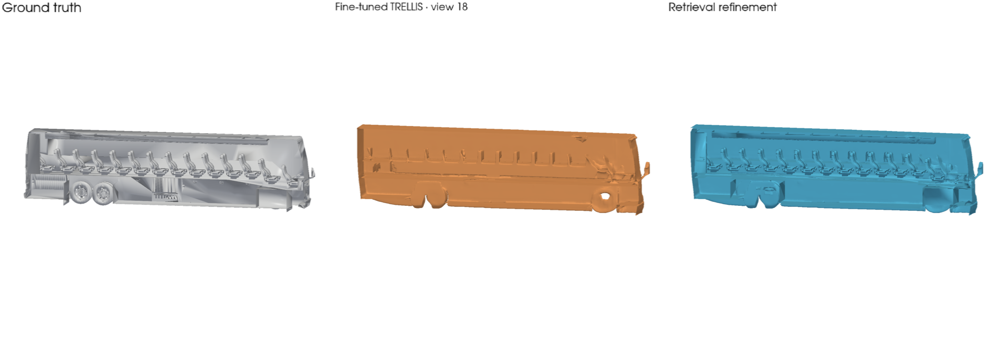

05. Internal F1 0.305 → 0.337 (+0.033) · structural_replace · bus__f0fb07c3592f55b2c2ae5d9462fe97f3


/var/folders/fx/7wx0ny_14f5gh3xtfrbdmdym0000gn/T/ipykernel_16660/1025251416.py:41: InvalidMeshWarning: PolyData mesh is not valid:
 - Mesh has 1 cell array with incorrect length (length must be 87058). Invalid array: 'vtkOriginalCellIds' (87050)
  cut = surfaces[label].clip(normal=normal, origin=cut_origin, invert=True)
/Users/peter/Desktop/Semester 2/ML3D/ML3D/lib/python3.14/site-packages/vtkmodules/util/vtkAlgorithm.py:198: InvalidMeshWarning: PolyData mesh is not valid:
 - Mesh has 1 cell array with incorrect length (length must be 87058). Invalid array: 'vtkOriginalCellIds' (87050)
  return self.RequestData(request, inInfo, outInfo)
/var/folders/fx/7wx0ny_14f5gh3xtfrbdmdym0000gn/T/ipykernel_16660/1025251416.py:44: InvalidMeshWarning: PolyData mesh is not valid:
 - Mesh has 1 cell array with incorrect length (length must be 87058). Invalid array: 'vtkOriginalCellIds' (87050)
  plotter.add_mesh(


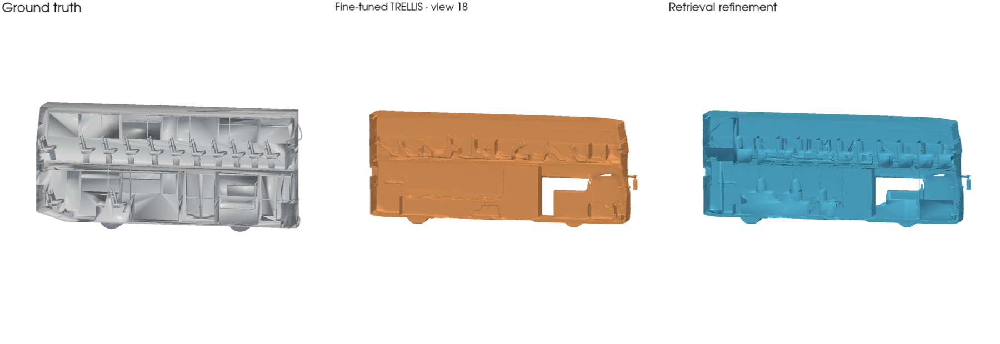

06. Internal F1 0.329 → 0.327 (-0.003) · component_hybrid · bus__e92f10218f66fcd64931a7929d89a2d3


/var/folders/fx/7wx0ny_14f5gh3xtfrbdmdym0000gn/T/ipykernel_16660/1025251416.py:5: PyVistaFutureWarning: The default value of `algorithm` for the filter
`PolyData.extract_surface` will change in the future. It currently defaults to
`'dataset_surface'`, but will change to `None`. Explicitly set the `algorithm` keyword to
silence this warning.
  surface = mesh.extract_surface().triangulate().clean()


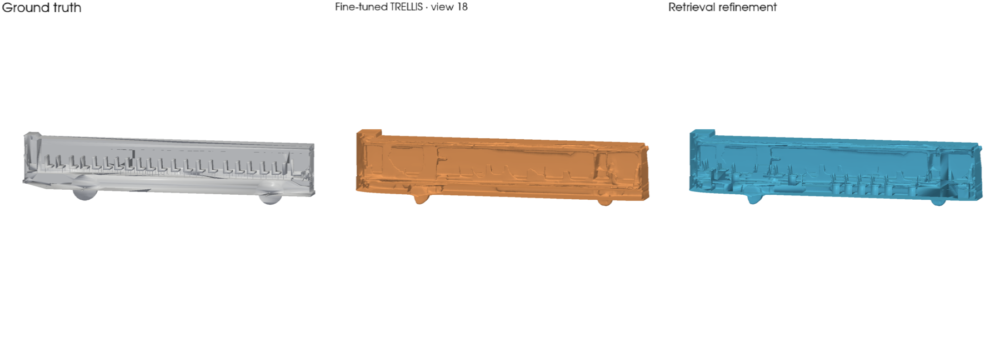

07. Internal F1 0.463 → 0.439 (-0.024) · component_hybrid · bus__f7c66493e877829eff8a739dd4de4368


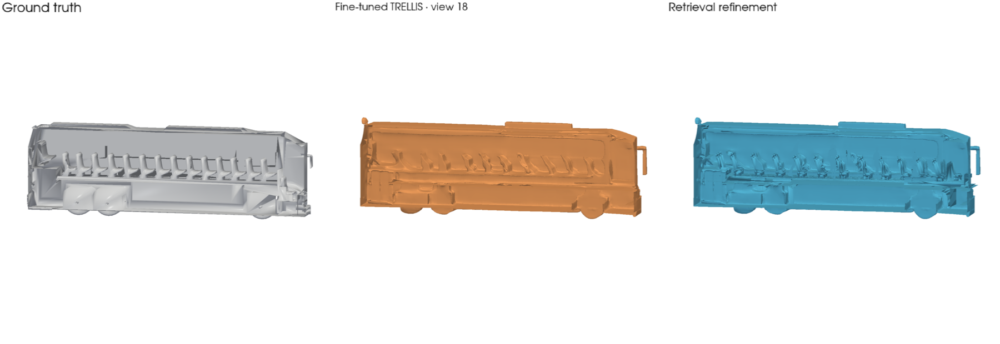

08. Internal F1 0.484 → 0.418 (-0.066) · structural_replace · bus__f61fe8b152f5888a54f791e4a421252


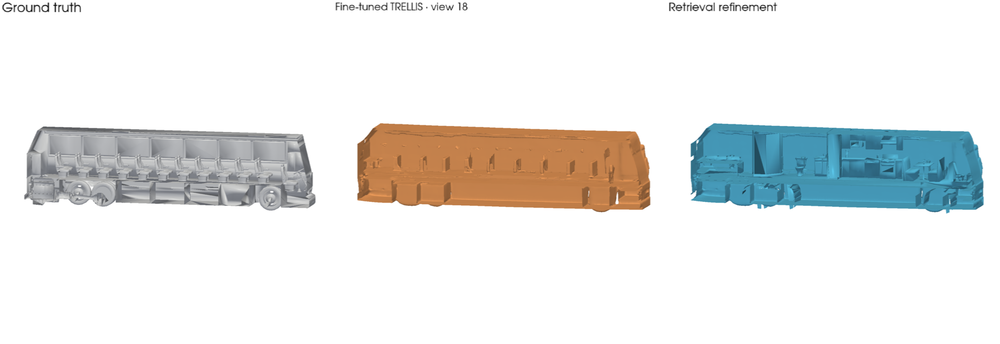

09. Internal F1 0.358 → 0.284 (-0.074) · structural_replace · bus__f735f0310f9240227037eba625e09a52


Context leak detected, CoreAnalytics returned false


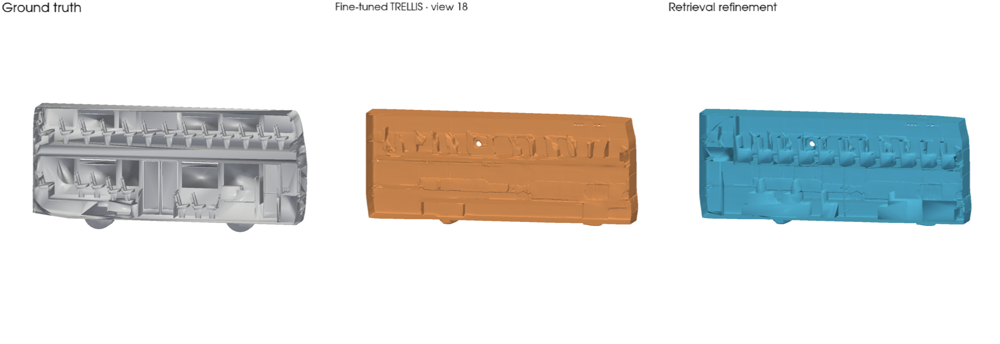

10. Internal F1 0.362 → 0.285 (-0.077) · component_hybrid · bus__f90bafa70be9bf1bd4713685ae50fa13


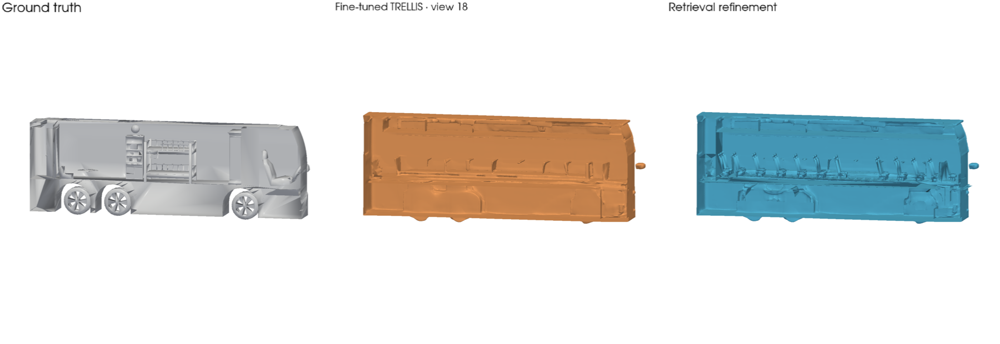

### Car — 10 examples

01. Internal F1 0.426 → 0.834 (+0.408) · component_hybrid · car__fabcb04fc015f822ca8bf2993ca245b


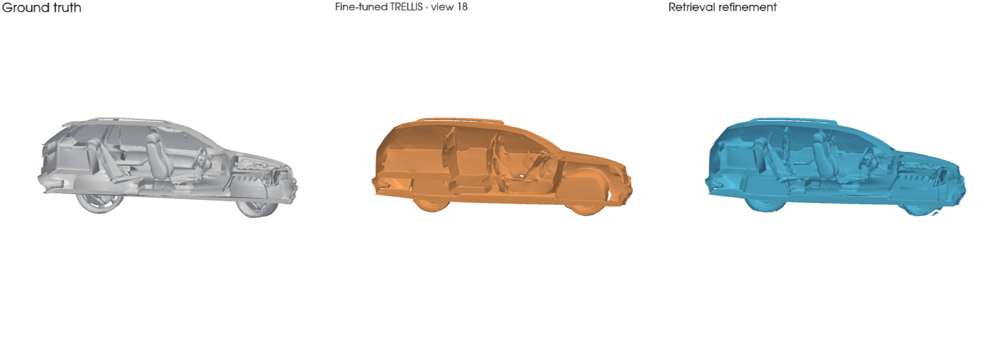

02. Internal F1 0.412 → 0.754 (+0.342) · structural_replace · car__f1b928427f5a3a7fc6d5ebddbbbc39f


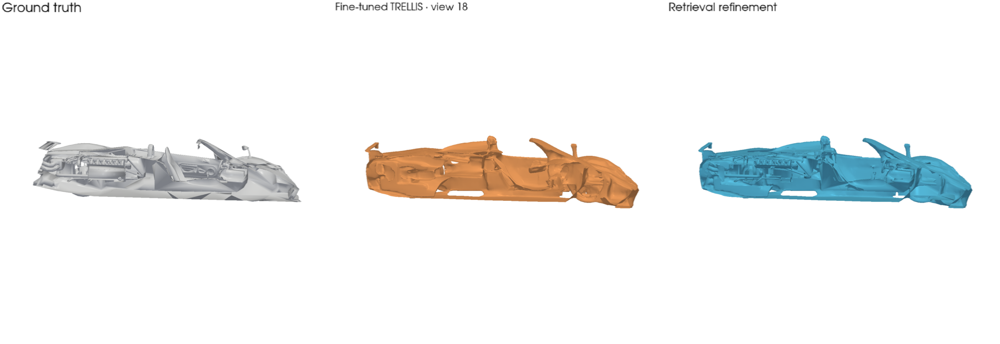

03. Internal F1 0.330 → 0.621 (+0.291) · structural_replace · car__f1a20b5b20366d5378df335b5e4f64d1


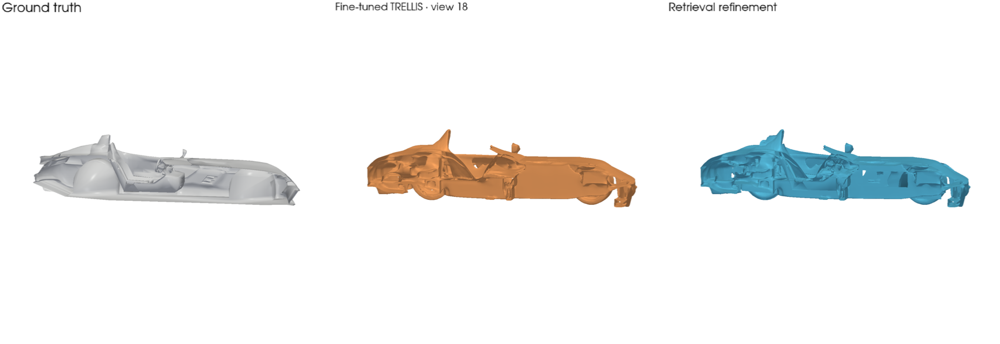

04. Internal F1 0.467 → 0.739 (+0.272) · component_hybrid · car__e8a8d47957d15bbf8079d5a13e411210


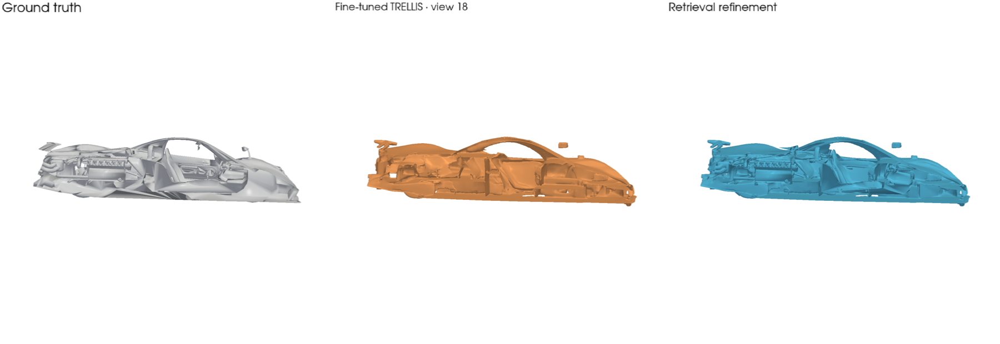

05. Internal F1 0.315 → 0.429 (+0.113) · structural_replace · car__eec2ea5ac4e048836a2345809e2bb169


/var/folders/fx/7wx0ny_14f5gh3xtfrbdmdym0000gn/T/ipykernel_16660/1025251416.py:41: InvalidMeshWarning: PolyData mesh is not valid:
 - Mesh has 1 cell array with incorrect length (length must be 152058). Invalid array: 'vtkOriginalCellIds' (152024)
  cut = surfaces[label].clip(normal=normal, origin=cut_origin, invert=True)
/Users/peter/Desktop/Semester 2/ML3D/ML3D/lib/python3.14/site-packages/vtkmodules/util/vtkAlgorithm.py:198: InvalidMeshWarning: PolyData mesh is not valid:
 - Mesh has 1 cell array with incorrect length (length must be 152058). Invalid array: 'vtkOriginalCellIds' (152024)
  return self.RequestData(request, inInfo, outInfo)
/var/folders/fx/7wx0ny_14f5gh3xtfrbdmdym0000gn/T/ipykernel_16660/1025251416.py:44: InvalidMeshWarning: PolyData mesh is not valid:
 - Mesh has 1 cell array with incorrect length (length must be 152058). Invalid array: 'vtkOriginalCellIds' (152024)
  plotter.add_mesh(


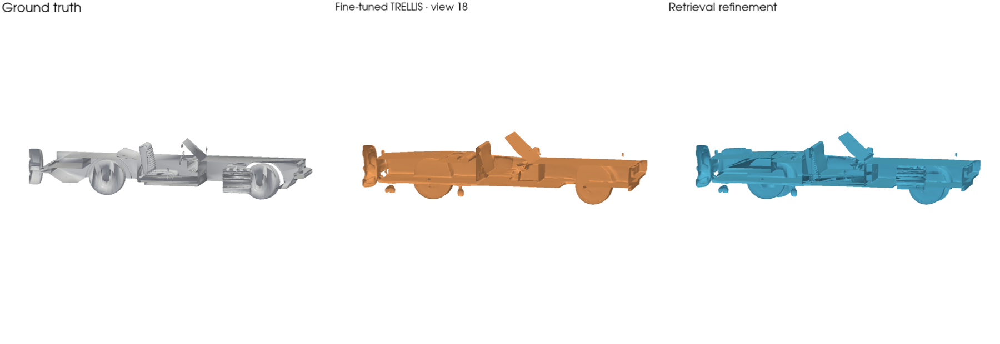

06. Internal F1 0.470 → 0.612 (+0.141) · component_hybrid · car__f06af3b73004c92ec7193c87bbfa9088


/var/folders/fx/7wx0ny_14f5gh3xtfrbdmdym0000gn/T/ipykernel_16660/1025251416.py:5: PyVistaFutureWarning: The default value of `algorithm` for the filter
`PolyData.extract_surface` will change in the future. It currently defaults to
`'dataset_surface'`, but will change to `None`. Explicitly set the `algorithm` keyword to
silence this warning.
  surface = mesh.extract_surface().triangulate().clean()


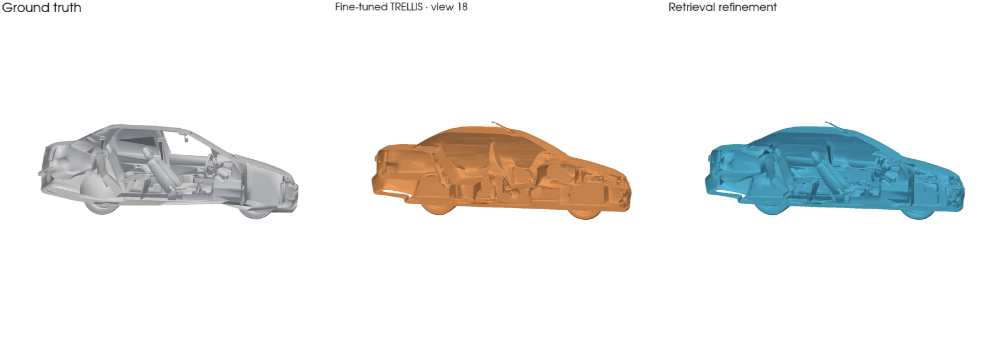

07. Internal F1 0.414 → 0.523 (+0.110) · component_hybrid · car__e67e3e3a21393927df59757e1209f2c7


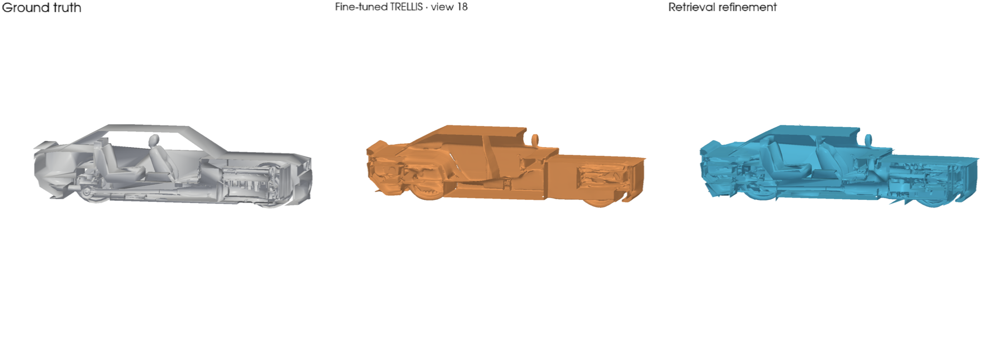

08. Internal F1 0.429 → 0.514 (+0.085) · structural_replace · car__eb59c9376d1e04ab49352dd33f95cb9e


/var/folders/fx/7wx0ny_14f5gh3xtfrbdmdym0000gn/T/ipykernel_16660/1025251416.py:41: InvalidMeshWarning: PolyData mesh is not valid:
 - Mesh has 1 cell array with incorrect length (length must be 238464). Invalid array: 'vtkOriginalCellIds' (238458)
  cut = surfaces[label].clip(normal=normal, origin=cut_origin, invert=True)
/Users/peter/Desktop/Semester 2/ML3D/ML3D/lib/python3.14/site-packages/vtkmodules/util/vtkAlgorithm.py:198: InvalidMeshWarning: PolyData mesh is not valid:
 - Mesh has 1 cell array with incorrect length (length must be 238464). Invalid array: 'vtkOriginalCellIds' (238458)
  return self.RequestData(request, inInfo, outInfo)
/var/folders/fx/7wx0ny_14f5gh3xtfrbdmdym0000gn/T/ipykernel_16660/1025251416.py:44: InvalidMeshWarning: PolyData mesh is not valid:
 - Mesh has 1 cell array with incorrect length (length must be 238464). Invalid array: 'vtkOriginalCellIds' (238458)
  plotter.add_mesh(


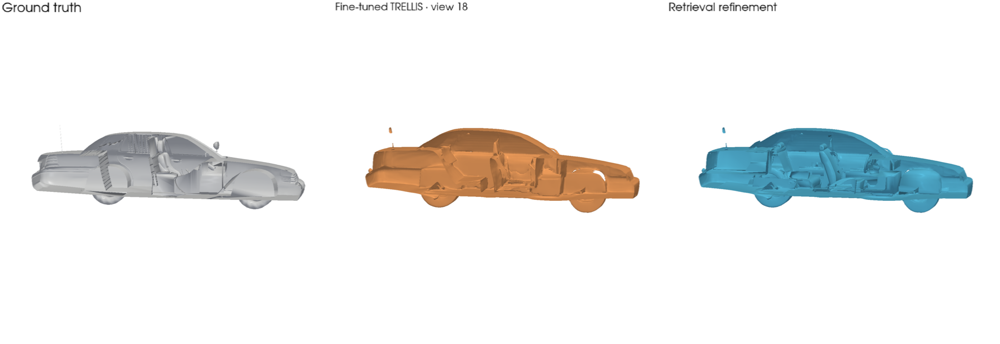

/var/folders/fx/7wx0ny_14f5gh3xtfrbdmdym0000gn/T/ipykernel_16660/1025251416.py:5: PyVistaFutureWarning: The default value of `algorithm` for the filter
`PolyData.extract_surface` will change in the future. It currently defaults to
`'dataset_surface'`, but will change to `None`. Explicitly set the `algorithm` keyword to
silence this warning.
  surface = mesh.extract_surface().triangulate().clean()


09. Internal F1 0.346 → 0.441 (+0.094) · component_hybrid · car__f10e32c6daaf237f13ded1857c15b5b6


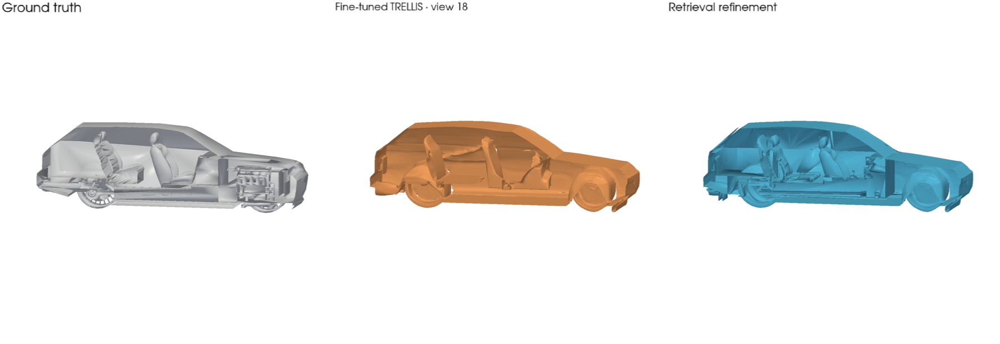

10. Internal F1 0.508 → 0.558 (+0.050) · component_hybrid · car__f21188e5f1a6468050bb0437668bebb7


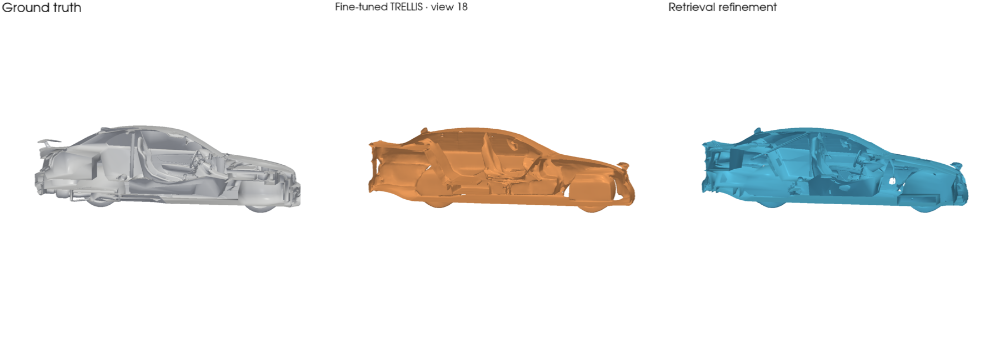

In [8]:
for category in CATEGORIES:
    display(Markdown(f"### {category.replace('_', ' ').title()} — {BEST_PER_CATEGORY} examples"))
    for index, sample_id in enumerate(best_ids_by_category[category], start=1):
        fine_tuned = refinement_metrics[sample_id]["objective1"]
        final = refinement_metrics[sample_id][FINAL_METHOD]
        state = "fallback" if final["fallback"] else final["policy_mode"]
        print(
            f"{index:02d}. Internal F1 {fine_tuned['f1']:.3f} → {final['f1']:.3f} "
            f"({pipeline2_f1_delta(sample_id):+.3f}) · {state} · {sample_id}"
        )
        display(render_smooth_comparison(sample_id, PIPELINE2_METHODS))